# Problema 1 - Algoritmos de binarización

Libs 📚

In [37]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.filters import threshold_multiotsu, frangi
from skimage.morphology import remove_small_objects

Funciones de utilidad 🗂️

In [31]:
def loadPGM(ruta):
    with open(ruta, 'r') as f:
        header = f.readline().strip()  # Leer "P2"
        if header != "P2":
            raise ValueError(f"Formato no soportado: {header}. Se esperaba P2.")

        # Leer comentarios
        dimensiones = f.readline().strip()
        while dimensiones.startswith("#"):
            dimensiones = f.readline().strip()

        width, height = map(int, dimensiones.split())  # Convertir dimensiones
        max_val = int(f.readline().strip())  # Leer máximo valor (255)

        # Leer los píxeles en formato texto y convertirlos a matriz NumPy
        img_data = np.array([int(valor) for valor in f.read().split()], dtype=np.uint8)
        img_data = img_data.reshape((height, width))  # Convertir a imagen

    return img_data


# Function to show the original image and the ground truth
def showImages(image, groundTruth, fileName):
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(image, cmap='gray')
    plt.title(f'Imagen Original: {fileName}')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(groundTruth, cmap='gray')
    plt.title(f'Ground Truth: {fileName}')
    plt.axis('off')
    plt.show()


Visualizar imágenes proporcionadas 🔍

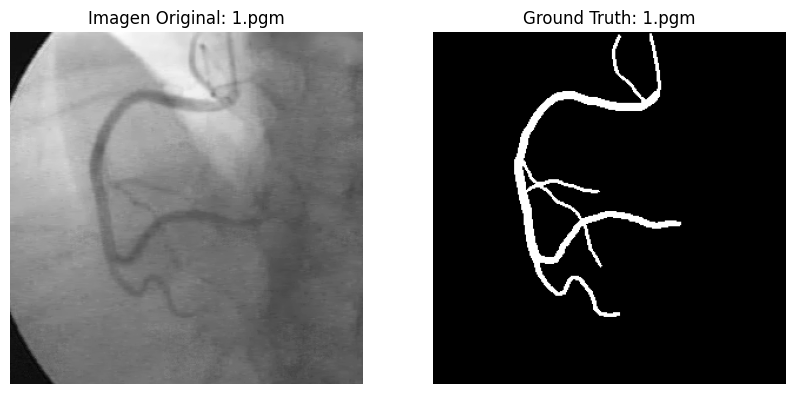

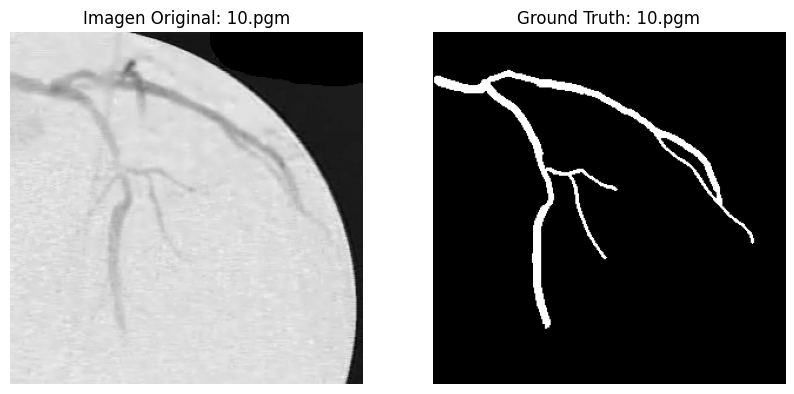

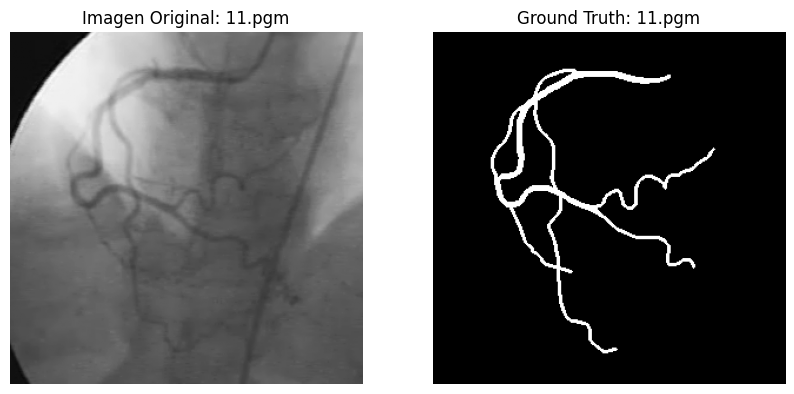

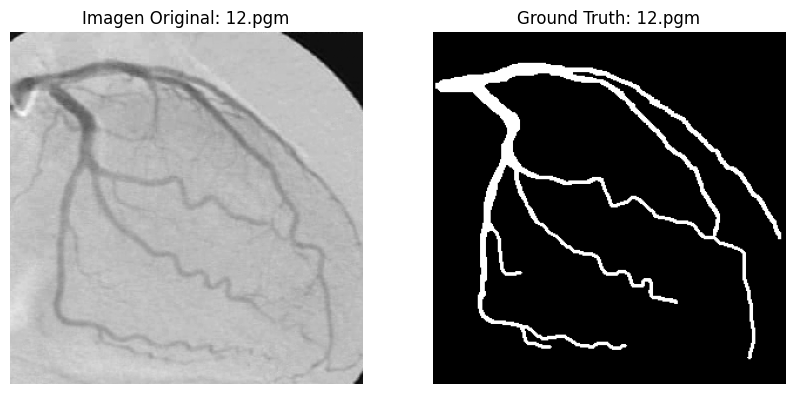

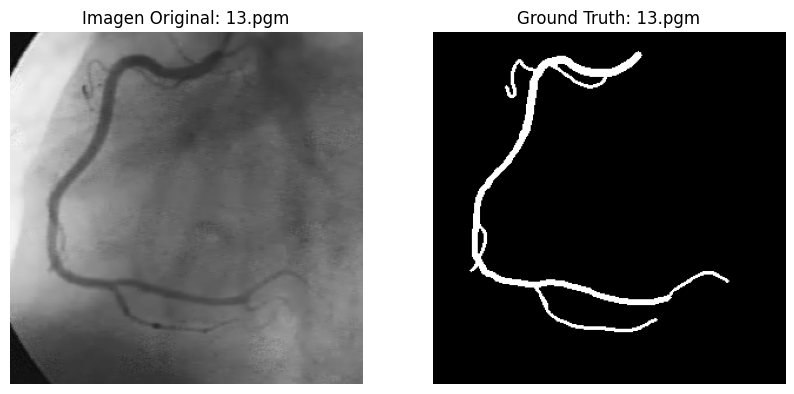

...

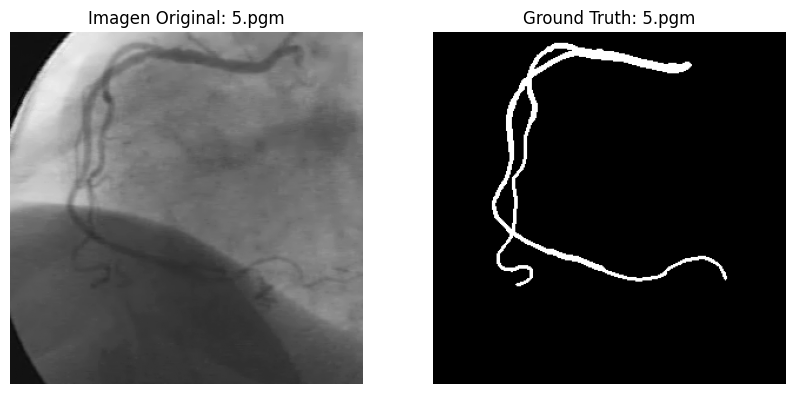

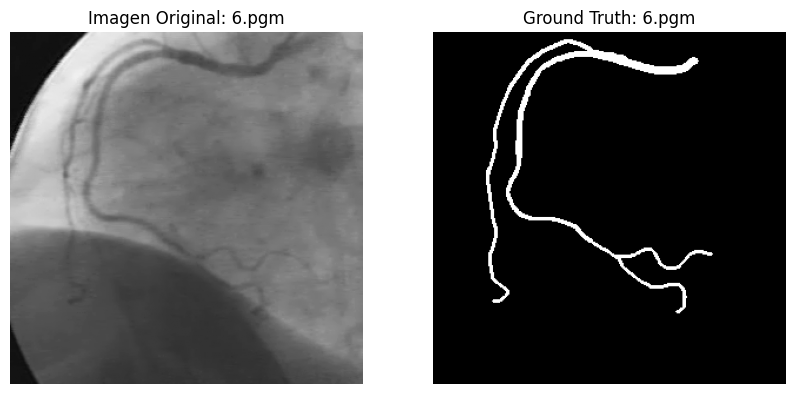

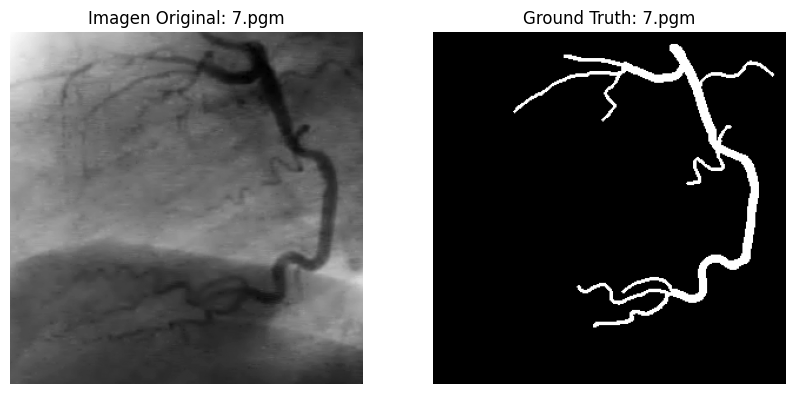

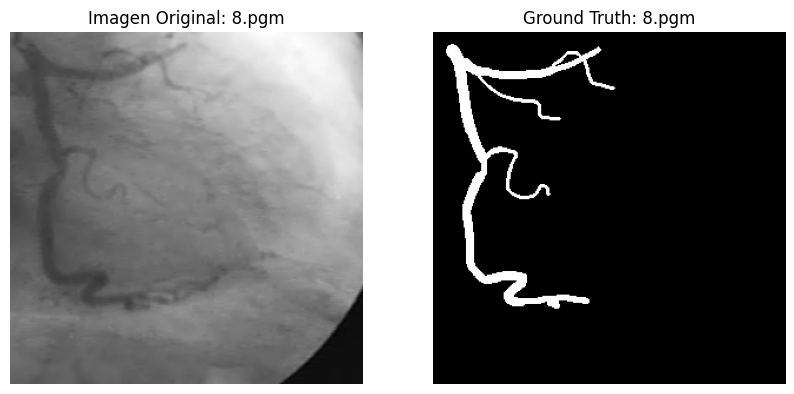

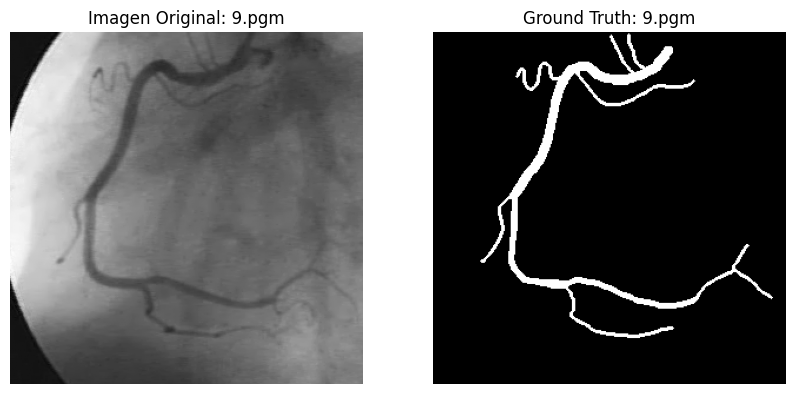

In [32]:
directorio = "database/database/"
archivos = sorted(os.listdir(directorio))
originalNames = [archivo for archivo in archivos if archivo.endswith(".pgm") and "_gt" not in archivo]
for name in originalNames:
    originalPath = os.path.join(directorio, name)
    gtPath = os.path.join(directorio, name.replace(".pgm", "_gt.pgm"))
    if os.path.exists(originalPath) and os.path.exists(gtPath):
        imagen = loadPGM(originalPath)
        groundTruth = loadPGM(gtPath)
        showImages(imagen, groundTruth, name)

### Implementación algoritmo Otsu 

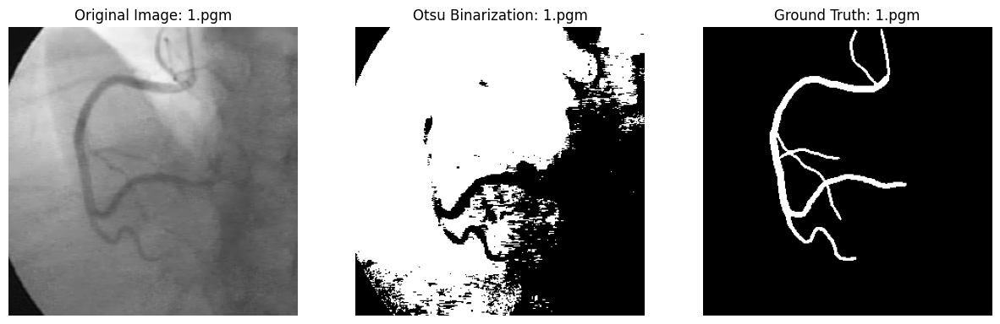

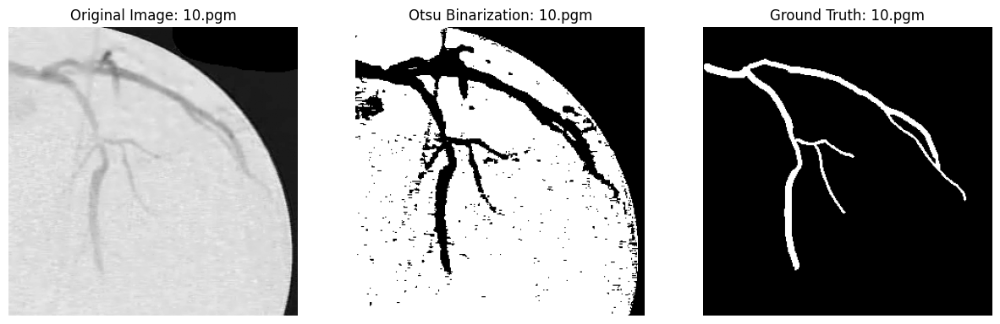

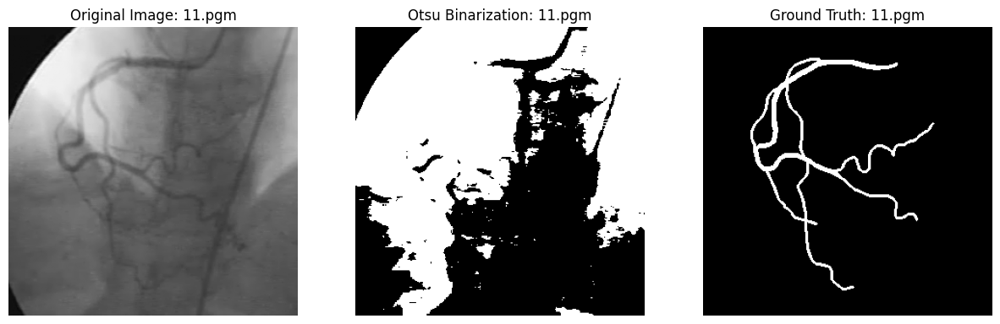

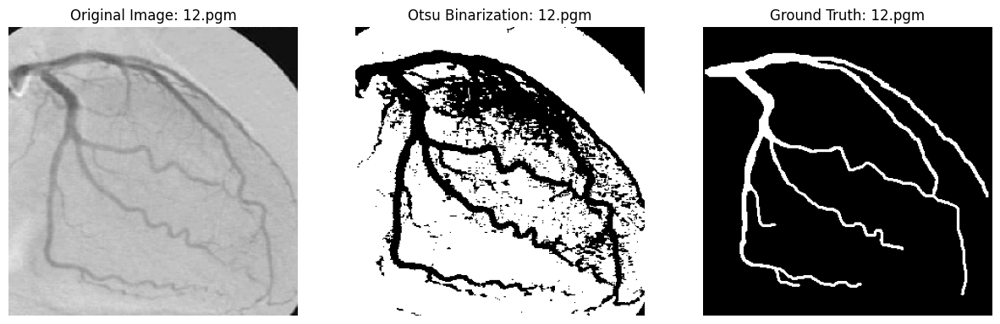

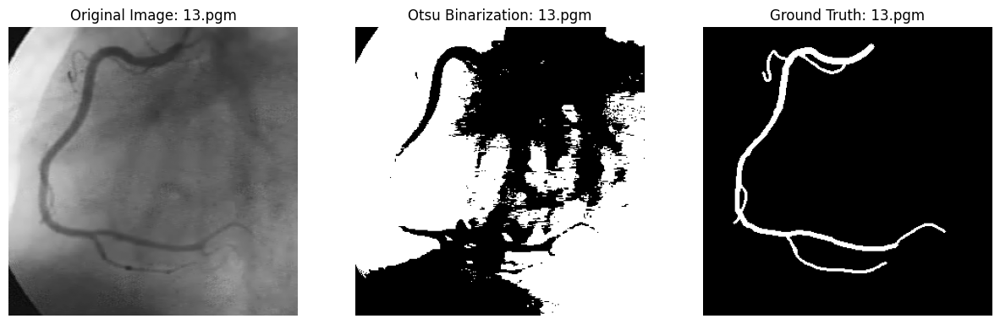

...

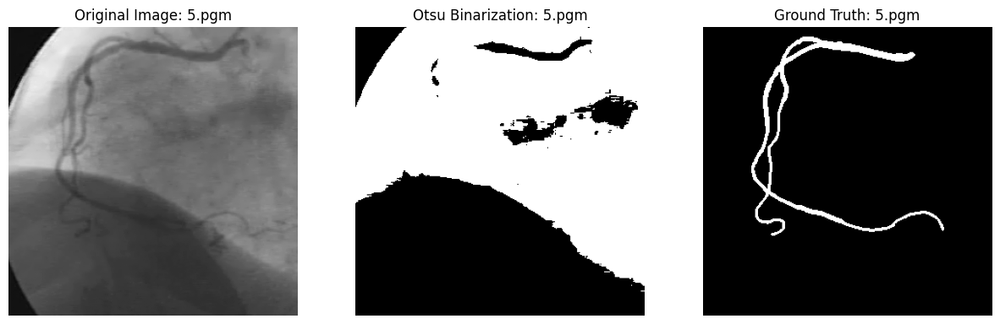

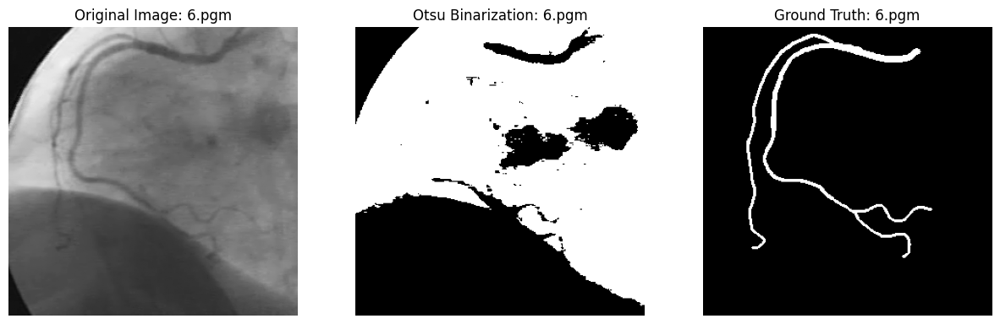

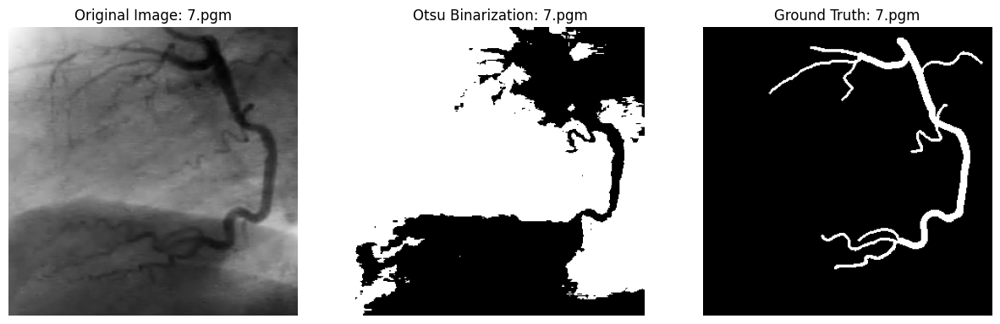

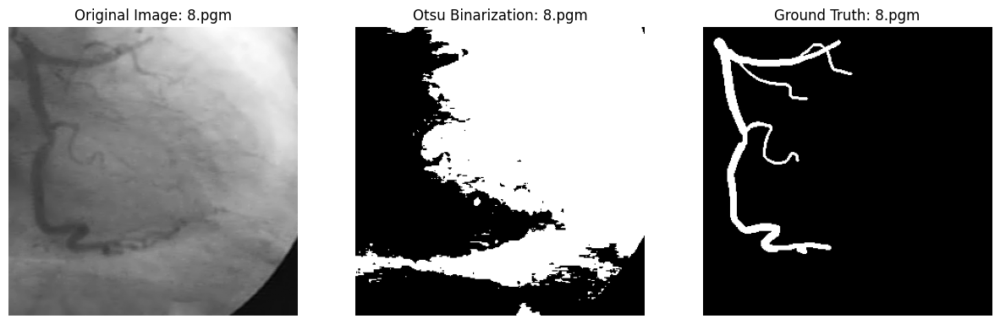

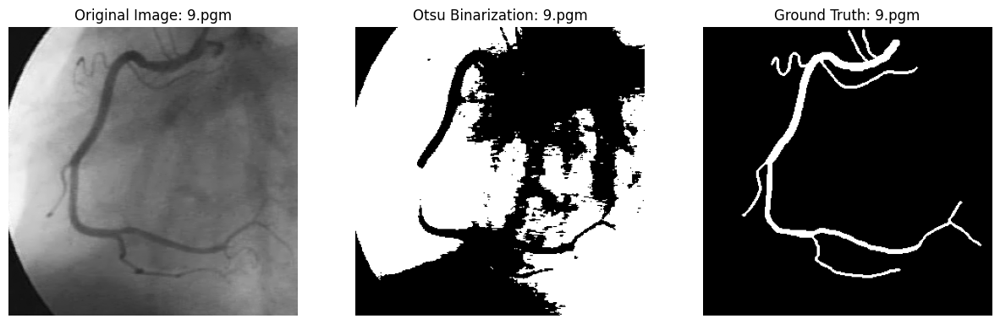

In [ ]:
# Implementación del algoritmo de Otsu para encontrar el umbral óptimo
def otsu_thresholding(image):
    # 1. Calcular el histograma de la imagen
    hist, bin_edges = np.histogram(image.flatten(), bins=256, range=(0, 256))
    total_pixels = image.size
    
    # 2. Normalizar el histograma para obtener la probabilidad de cada nivel de gris
    prob = hist / total_pixels
    
    # 3. Calcular la media global de la imagen
    cumulative_mean = np.cumsum(prob * np.arange(256))
    total_mean = cumulative_mean[-1]
    
    # 4. Inicializar variables para la búsqueda del umbral óptimo
    max_between_class_variance = 0
    best_threshold = 0
    
    # 5. Iterar sobre todos los posibles umbrales
    background_weight = 0
    background_mean = 0
    
    for threshold in range(1, 256):
        # Calculamos el peso y la media del fondo (clase 1)
        background_weight += prob[threshold - 1]
        if background_weight == 0:
            continue
        background_mean += (threshold - 1) * prob[threshold - 1]
        
        # Calculamos el peso y la media del primer plano (clase 2)
        foreground_weight = 1 - background_weight
        if foreground_weight == 0:
            continue
        foreground_mean = (cumulative_mean[-1] - background_mean) / foreground_weight
        
        # Calcular la varianza entre clases (la separación de clases)
        between_class_variance = background_weight * foreground_weight * (background_mean - foreground_mean) ** 2
        
        # Verificar si encontramos un mejor umbral (maximizar la varianza entre clases)
        if between_class_variance > max_between_class_variance:
            max_between_class_variance = between_class_variance
            best_threshold = threshold
    
    return best_threshold

# Función para binarizar la imagen usando el umbral de Otsu
def binarize_otsu(image, threshold):
    # Convertir la imagen a binaria comparando con el umbral encontrado
    binary_image = np.where(image >= threshold, 255, 0).astype(np.uint8)
    return binary_image

# Redimensionar imagen
def resize_image(image, target_size=(300, 300)):
    if image.shape != target_size:
        image = cv2.resize(image, target_size)
    return image

# Ruta de las imágenes
directory = "database/database/"
files = sorted(os.listdir(directory))
originalNames = [file for file in files if file.endswith(".pgm") and "_gt" not in file]

# Procesar cada imagen
for fileName in originalNames:
    originalPath = os.path.join(directory, fileName)
    gtPath = os.path.join(directory, fileName.replace(".pgm", "_gt.pgm"))

    if os.path.exists(originalPath) and os.path.exists(gtPath):
        image = loadPGM(originalPath)
        groundTruth = loadPGM(gtPath)

        # Usar Otsu para obtener el umbral
        threshold = otsu_thresholding(image)
        
        # Binarizar la imagen usando el umbral encontrado
        binaryImage = binarize_otsu(image, threshold)

        # Mostrar resultados
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(image, cmap='gray')
        plt.title(f'Original Image: {fileName}')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(binaryImage, cmap='gray')
        plt.title(f'Otsu Binarization: {fileName}')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(groundTruth, cmap='gray')
        plt.title(f'Ground Truth: {fileName}')
        plt.axis('off')

        plt.show()


### Preprocesamiento de imagen

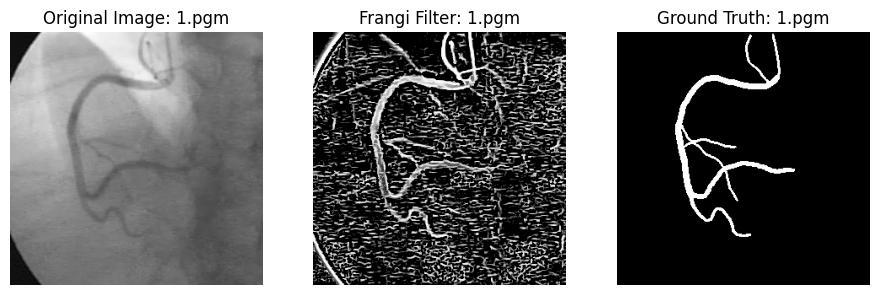

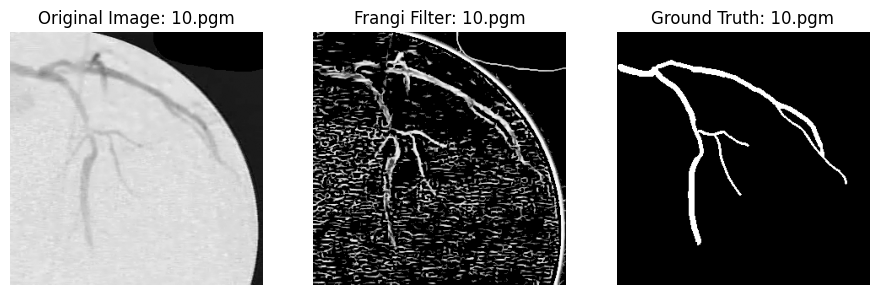

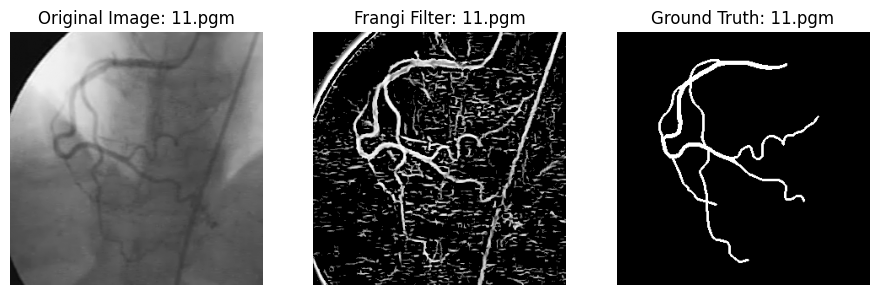

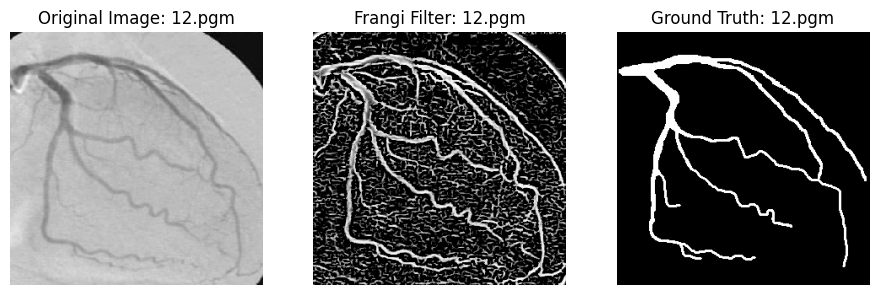

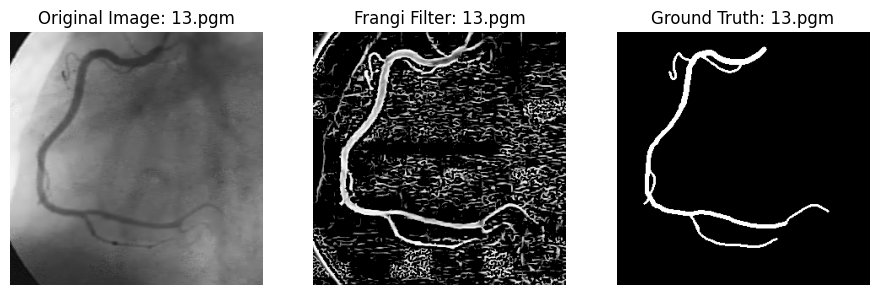

...

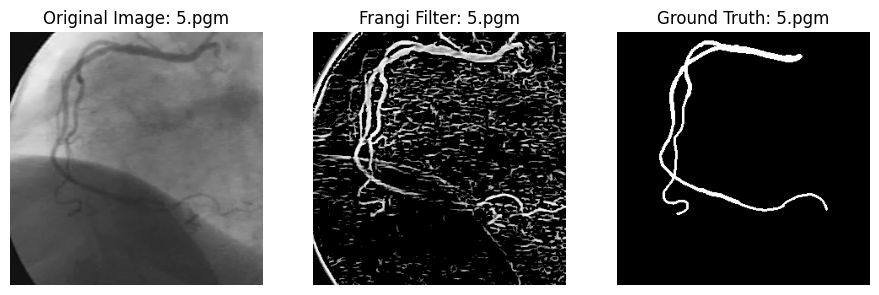

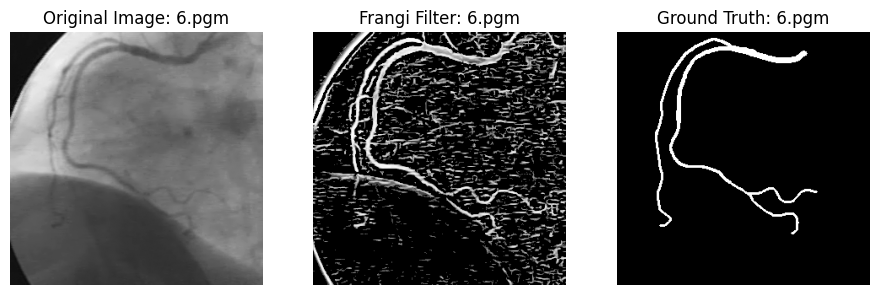

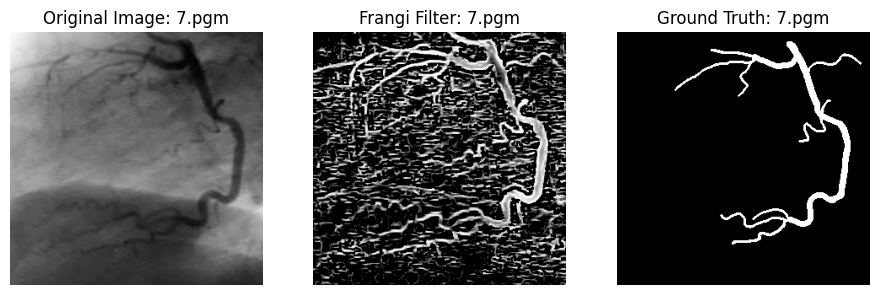

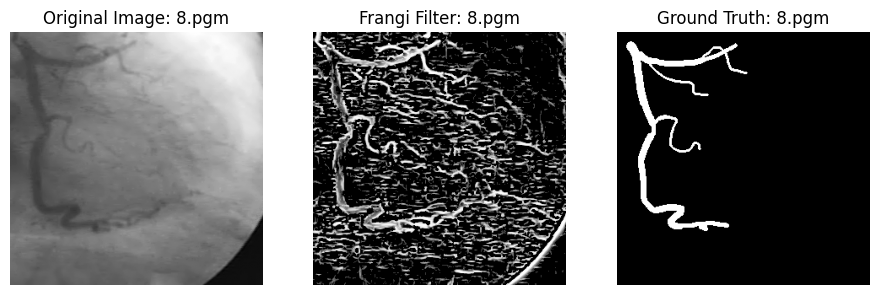

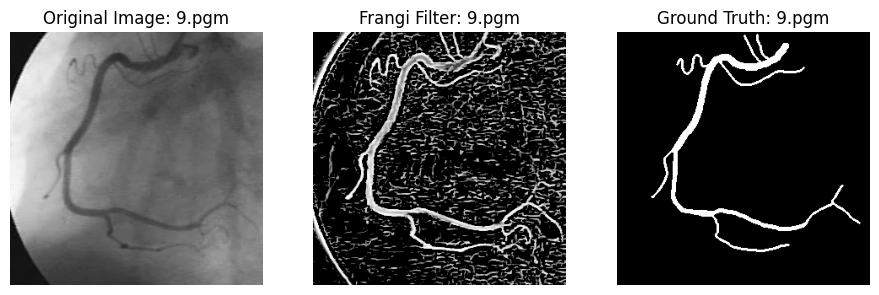

In [ ]:
directory = "database/database/"
files = sorted(os.listdir(directory))
originalNames = [file for file in files if file.endswith(".pgm") and "_gt" not in file]

for fileName in originalNames:
    originalPath = os.path.join(directory, fileName)
    gtPath = os.path.join(directory, fileName.replace(".pgm", "_gt.pgm"))

    if os.path.exists(originalPath) and os.path.exists(gtPath):
        image = loadPGM(originalPath)
        groundTruth = loadPGM(gtPath)

        # 1. Aplicar CLAHE para mejorar el contraste
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        enhanced_image = clahe.apply(image)

        # 2. Aplicar el filtro de Frangi para resaltar estructuras tubulares
        frangi_image = frangi(enhanced_image, sigmas=np.arange(1, 10, 1))

        # 3. Normalizar el resultado de Frangi
        frangi_norm = (frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255
        frangi_norm = frangi_norm.astype(np.uint8)

        # 4. Ajustar la intensidad de la imagen 
        frangi_norm = cv2.equalizeHist(frangi_norm)

        # 5. Aplicar un filtro Gaussiano para reducir el ruido
        smoothed_image = cv2.GaussianBlur(frangi_norm, (5, 5), 0)

        plt.figure(figsize=(15, 5))
        plt.subplot(1, 4, 1)
        plt.imshow(image, cmap='gray')
        plt.title(f'Original Image: {fileName}')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.imshow(frangi_norm, cmap='gray')
        plt.title(f'Frangi Filter: {fileName}')
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.imshow(groundTruth, cmap='gray')
        plt.title(f'Ground Truth: {fileName}')
        plt.axis('off')

        plt.show()


### Implementación de Otsu a imagen preprocesada junto al postprocesamiento

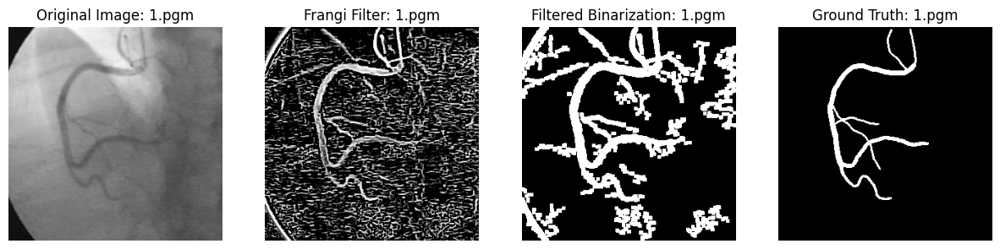

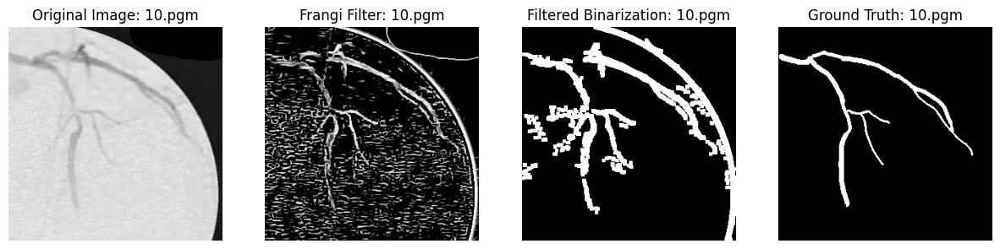

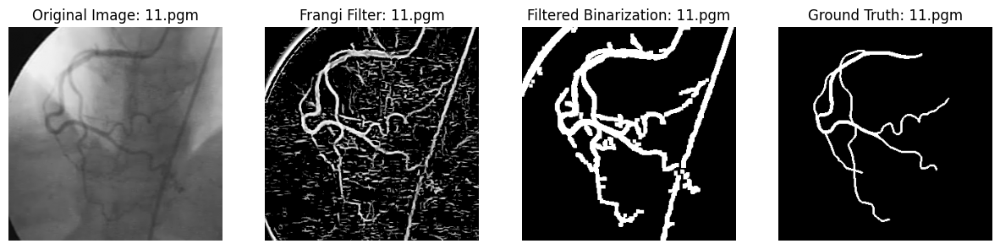

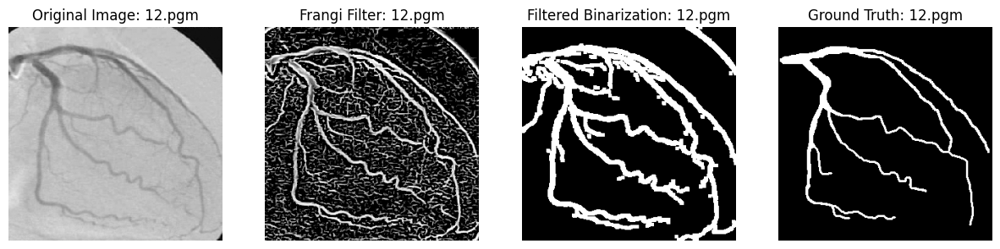

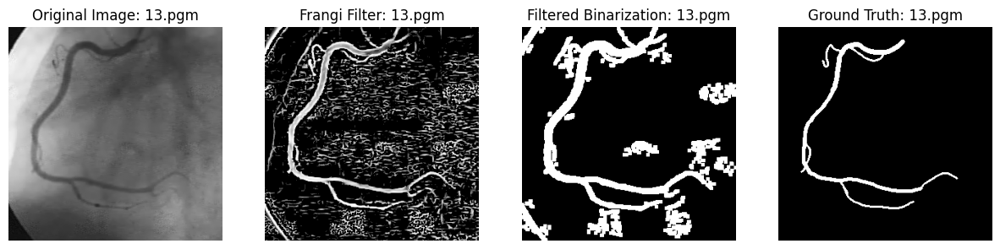

...

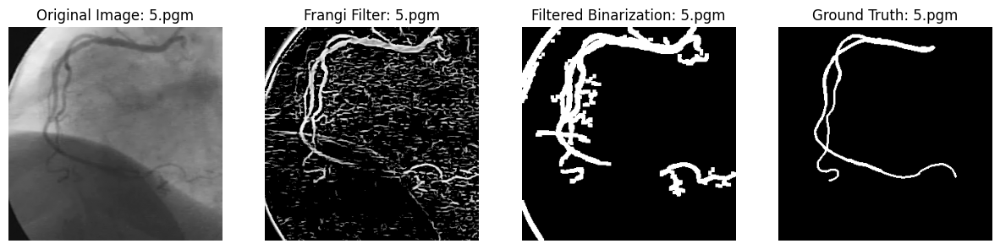

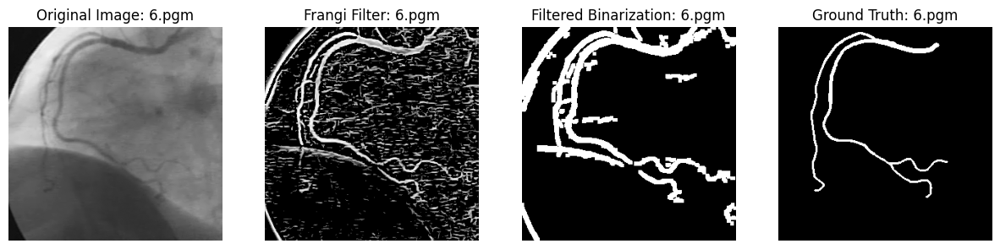

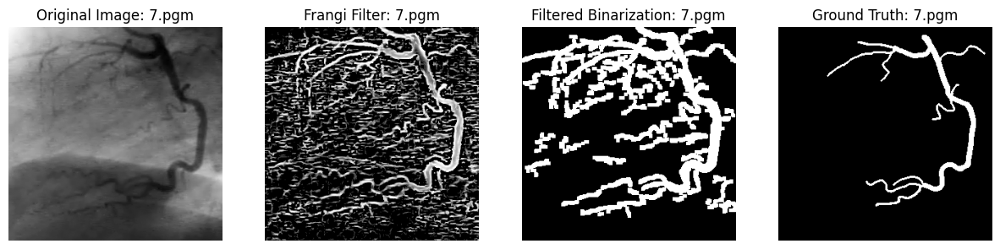

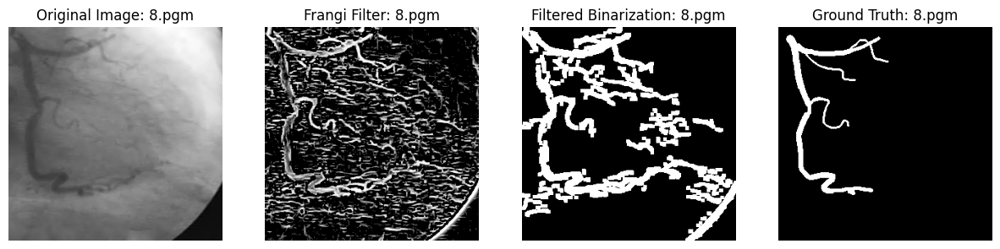

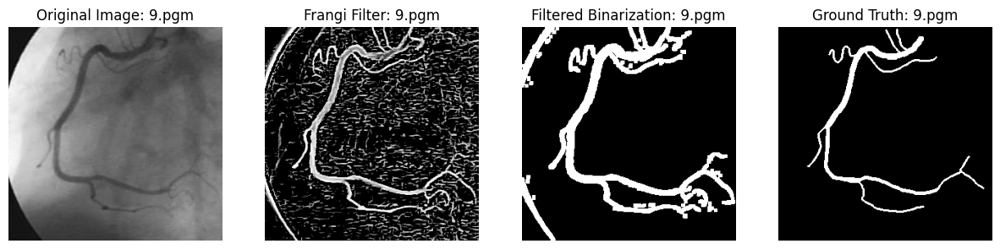

In [ ]:
# Cargar y procesar las imágenes
directory = "database/database/"
files = sorted(os.listdir(directory))
originalNames = [file for file in files if file.endswith(".pgm") and "_gt" not in file]

for fileName in originalNames:
    originalPath = os.path.join(directory, fileName)
    gtPath = os.path.join(directory, fileName.replace(".pgm", "_gt.pgm"))

    if os.path.exists(originalPath) and os.path.exists(gtPath):
        image = loadPGM(originalPath)
        groundTruth = loadPGM(gtPath)

        # Redimensionar la imagen a 300x300 si es necesario
        image_resized = resize_image(image, target_size=(300, 300))

        # Aplica el filtro CLAHE para mejorar el contraste
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        enhanced_image = clahe.apply(image_resized)

        # Aplica el filtro de Frangi (sin librería OpenCV)
        frangi_image = frangi(enhanced_image, sigmas=np.arange(1, 10, 1))  # Ajusta el rango de sigmas según sea necesario

        # Normaliza la imagen de Frangi
        frangi_norm = (frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255
        frangi_norm = frangi_norm.astype(np.uint8)

        # Ecualización del histograma
        frangi_norm = cv2.equalizeHist(frangi_norm)

        # Aplicar desenfoque gaussiano
        smoothed_image = cv2.GaussianBlur(frangi_norm, (5, 5), 0)

        # Binarización Otsu
        otsu_threshold = otsu_thresholding(smoothed_image)
        otsu_binary_image = binarize_otsu(smoothed_image, otsu_threshold)

        # Realizar operaciones morfológicas para reducir el ruido
        kernel = np.ones((3, 3), np.uint8)
        eroded_image = cv2.erode(otsu_binary_image, kernel, iterations=1)
        dilated_image = cv2.dilate(eroded_image, kernel, iterations=2)

        # Filtrar componentes pequeñas
        filtered_image = remove_small_objects(dilated_image.astype(bool), min_size=300)
        filtered_image = (filtered_image * 255).astype(np.uint8)

        # Mostrar resultados
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 4, 1)
        plt.imshow(image_resized, cmap='gray')
        plt.title(f'Original Image: {fileName}')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.imshow(frangi_norm, cmap='gray')
        plt.title(f'Frangi Filter: {fileName}')
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.imshow(filtered_image, cmap='gray')
        plt.title(f'Filtered Binarization: {fileName}')
        plt.axis('off')

        plt.subplot(1, 4, 4)
        plt.imshow(groundTruth, cmap='gray')
        plt.title(f'Ground Truth: {fileName}')
        plt.axis('off')

        plt.show()
